In [ ]:
"""
batmf
File Name: ex1_visual_cell_verification.ipynb

Description: dataset verification and remove cells from cleasing and interpolation function


anaomalies from create_cae_v1_t1


Author: junghwan lee
Email: jhrrlee@gmail.com
Date Created: 2023.10.08

"""

In [1]:
import sys
from pathlib import Path

In [3]:
#local
sys.path.append('../')
data_path = Path('..') /'..'/'..'/'data'
gen_path = Path('..')/'..'/'resource'/ 'dataset'

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pickle
import matplotlib.colors as colors
import matplotlib
import matplotlib.cm as cm
from matplotlib.cm import ScalarMappable
from sklearn.preprocessing import MinMaxScaler
from tqdm import tqdm
from scipy import interpolate
import cleansing_lib as cl
from pathlib import Path

In [5]:
battery_ids  = np.load(gen_path / 'battery_ids.npy')
eol = np.load(gen_path / 'eol_21_120.npy')
cycle_data = np.load(gen_path / 'interpolated_cycle_data_21_120.npy')
new_cycle_sum = np.load(gen_path / 'new_cycle_sum_21_120.npy')

In [6]:
cycle_count = np.arange(1, cycle_data.shape[1]+1)

num_cells = eol.shape[0]
num_cycles = cycle_count.shape[0]

# Repeat the EOL values for each cycle in the cycle_count array
eol_repeated = np.tile(eol, (1, num_cycles))

# Repeat the cycle_count values for each cell in the cycle_count array
cycle_count_repeated = np.tile(cycle_count, (num_cells, 1))

RUL_repeated = eol_repeated - cycle_count_repeated

print("RUL_repeated shape:", RUL_repeated.shape)
print("eol shape:", eol_repeated.shape)
print("cycle_count shape:", cycle_count_repeated.shape)
print("cycle_data shape:", cycle_data.shape)
print("new_cycle_sum shape:", new_cycle_sum.shape)

RUL_repeated shape: (124, 100)
eol shape: (124, 100)
cycle_count shape: (124, 100)
cycle_data shape: (124, 100, 8, 1000)
new_cycle_sum shape: (124, 14, 100)


In [6]:
battery_ids

array(['b1c0', 'b1c1', 'b1c2', 'b1c3', 'b1c4', 'b1c5', 'b1c6', 'b1c7',
       'b1c9', 'b1c11', 'b1c14', 'b1c15', 'b1c16', 'b1c17', 'b1c18',
       'b1c19', 'b1c20', 'b1c21', 'b1c23', 'b1c24', 'b1c25', 'b1c26',
       'b1c27', 'b1c28', 'b1c29', 'b1c30', 'b1c31', 'b1c32', 'b1c33',
       'b1c34', 'b1c35', 'b1c36', 'b1c37', 'b1c38', 'b1c39', 'b1c40',
       'b1c41', 'b1c42', 'b1c43', 'b1c44', 'b1c45', 'b2c0', 'b2c1',
       'b2c2', 'b2c3', 'b2c4', 'b2c5', 'b2c6', 'b2c10', 'b2c11', 'b2c12',
       'b2c13', 'b2c14', 'b2c17', 'b2c18', 'b2c19', 'b2c20', 'b2c21',
       'b2c22', 'b2c23', 'b2c24', 'b2c25', 'b2c26', 'b2c27', 'b2c28',
       'b2c29', 'b2c30', 'b2c31', 'b2c32', 'b2c33', 'b2c34', 'b2c35',
       'b2c36', 'b2c37', 'b2c38', 'b2c39', 'b2c40', 'b2c41', 'b2c42',
       'b2c43', 'b2c44', 'b2c45', 'b2c46', 'b2c47', 'b3c0', 'b3c1',
       'b3c3', 'b3c4', 'b3c5', 'b3c6', 'b3c7', 'b3c8', 'b3c9', 'b3c10',
       'b3c11', 'b3c12', 'b3c13', 'b3c14', 'b3c15', 'b3c16', 'b3c17',
       'b3c18', 'b

In [7]:
# Adjust the display settings
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

In [8]:
df = pd.DataFrame({
  'Index': range(len(battery_ids)),
  'Key': battery_ids
})

In [ ]:
df

## anaomalies create_cae_v1_t1

In [54]:
anomalies = [14, 41, 42, 43, 44, 45, 47, 48, 50, 51, 53, 54, 55, 60, 61, 63, 71, 76, 77, 82, 83, 88, 89, 104, 110]

In [118]:
import importlib
import cleansing_lib
importlib.reload(cleansing_lib)
import cleansing_lib as cl

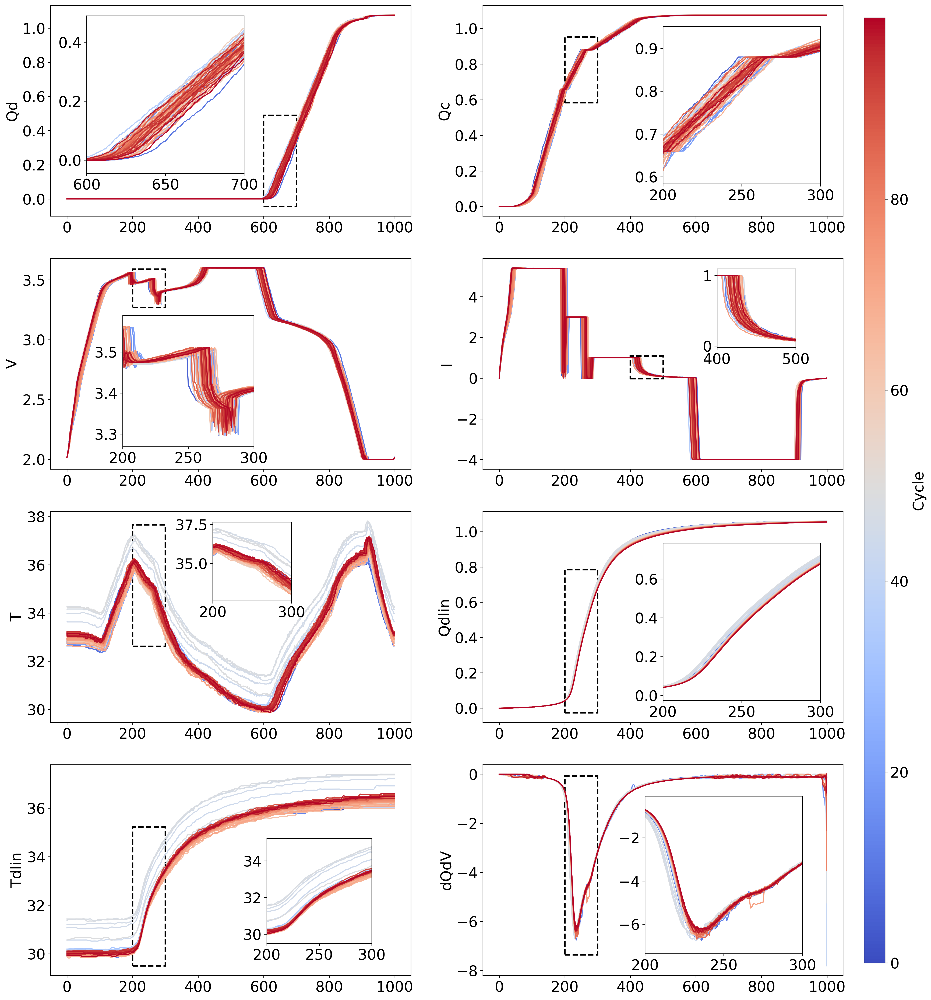

In [133]:
# Suppose you have 8 features
x_zoom_ranges = [
    (600, 700),  # for feature 0
    (200, 300),  # for feature 1
    (200, 300),  # for feature 1
    (400, 500),  # for feature 1
    (200, 300),  # for feature 1
    (200, 300),  # for feature 1
    (200, 300),  # for feature 1
    (200, 300),  # for feature 1
]

insets_positions = [
    (0.1, 0.95, 3, 3),
    (0.5, 0.90, 3, 3),
    (0.2, 0.73, 2.5, 2.5),
    (0.65, 0.95, 1.5, 1.5),
    (0.45, 0.95, 1.5, 1.5),
    (0.5, 0.85, 3, 3),
    (0.6, 0.65, 2, 2),
    (0.45, 0.85, 3, 3),
]




cl.plot_inp_cycles_fixed_inset(
    cycle_data, 
    cell_idx=10,
    x_zoom_ranges=x_zoom_ranges,    
    insets_positions=insets_positions,
    
    
)


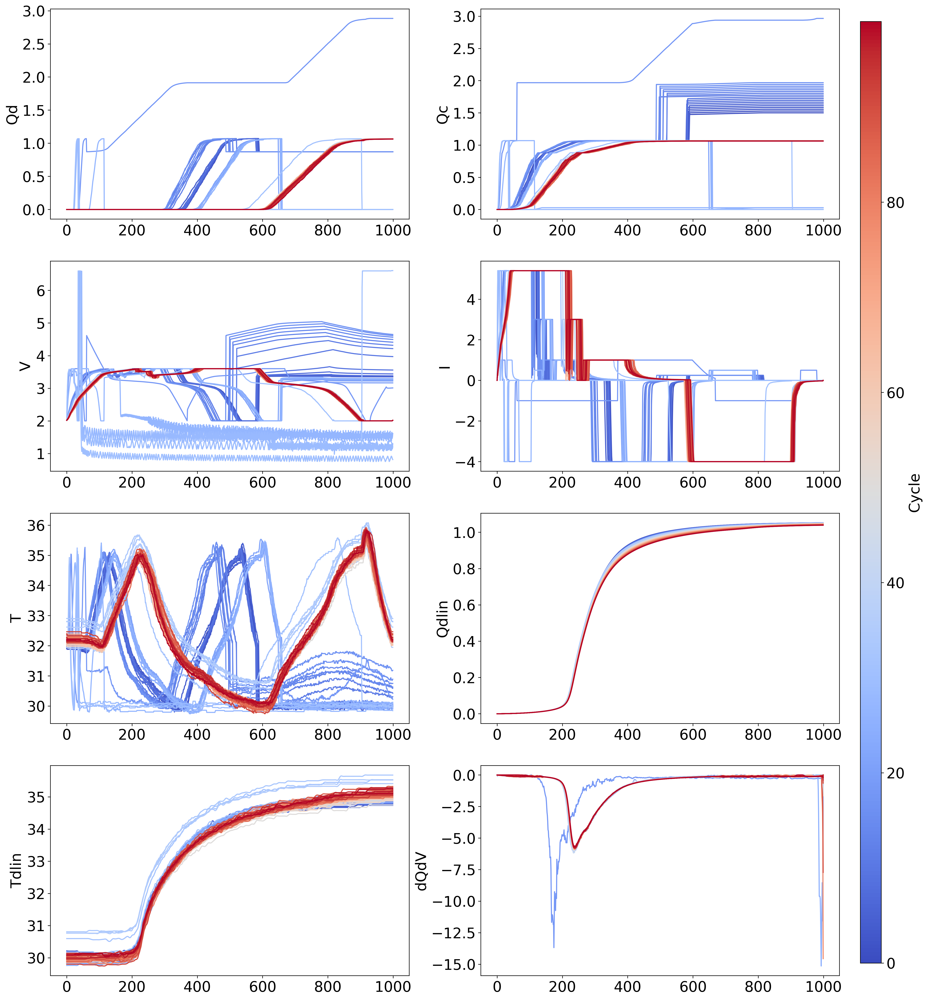

In [138]:
# Suppose you have 8 features
x_zoom_ranges = [
    None,  # for feature 0
    None,  # for feature 0
    None,  # for feature 0
    None,  # for feature 0
    None,  # for feature 0
    None,  # for feature 0
    None,  # for feature 0
    None,  # for feature 0
]

insets_positions = [
    (0.1, 0.95, 3, 3),
    (0.5, 0.90, 3, 3),
    (0.2, 0.73, 2.5, 2.5),
    (0.2, 0.73, 1.5, 1.5),
    (0.45, 0.95, 1.5, 1.5),
    (0.5, 0.85, 3, 3),
    (0.6, 0.65, 2, 2),
    (0.45, 0.85, 3, 3),
]




cl.plot_inp_cycles_fixed_inset(
    cycle_data, 
    cell_idx=14,
    x_zoom_ranges=x_zoom_ranges,    
    insets_positions=insets_positions,
    
    
)


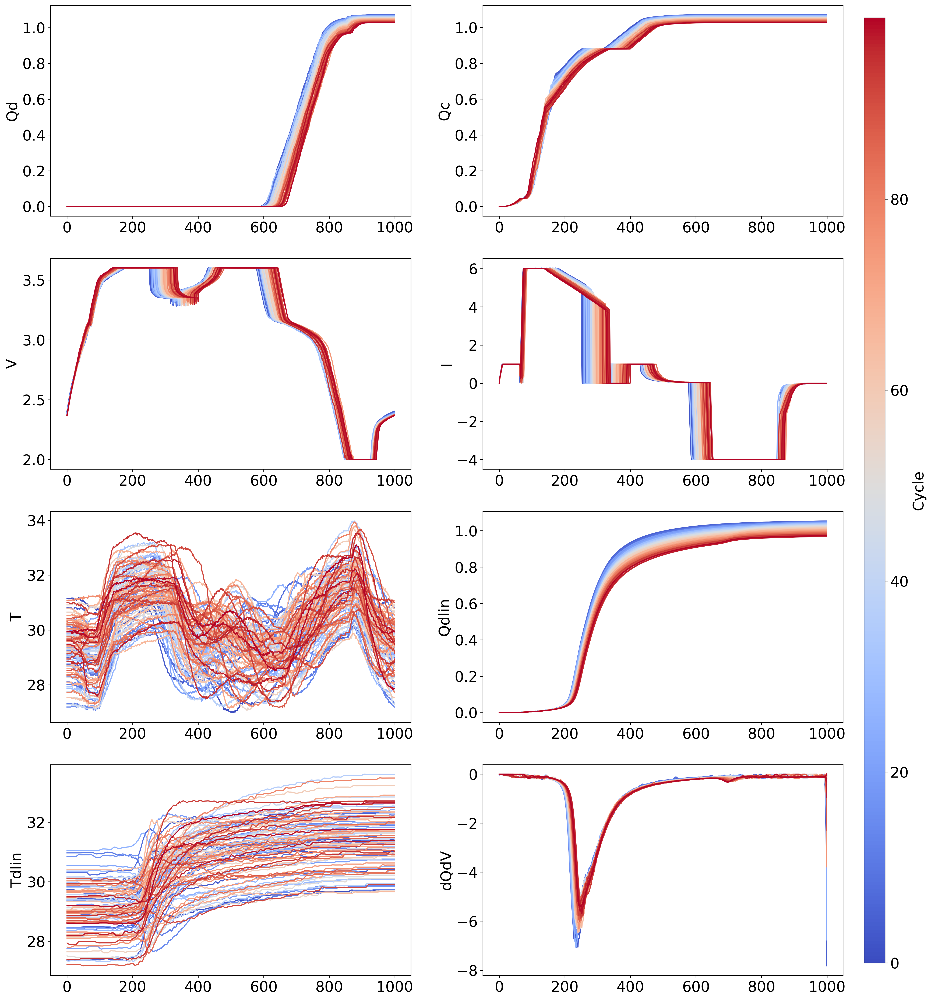

In [140]:
# Suppose you have 8 features
x_zoom_ranges = [
    None,  # for feature 0
    None,  # for feature 0
    None,  # for feature 0
    None,  # for feature 0
    None,  # for feature 0
    None,  # for feature 0
    None,  # for feature 0
    None,  # for feature 0
]

insets_positions = [
    (0.1, 0.95, 3, 3),
    (0.5, 0.90, 3, 3),
    (0.2, 0.73, 2.5, 2.5),
    (0.2, 0.73, 1.5, 1.5),
    (0.45, 0.95, 1.5, 1.5),
    (0.5, 0.85, 3, 3),
    (0.6, 0.65, 2, 2),
    (0.45, 0.85, 3, 3),
]




cl.plot_inp_cycles_fixed_inset(
    cycle_data, 
    cell_idx=41,
    x_zoom_ranges=x_zoom_ranges,    
    insets_positions=insets_positions,
    
    
)


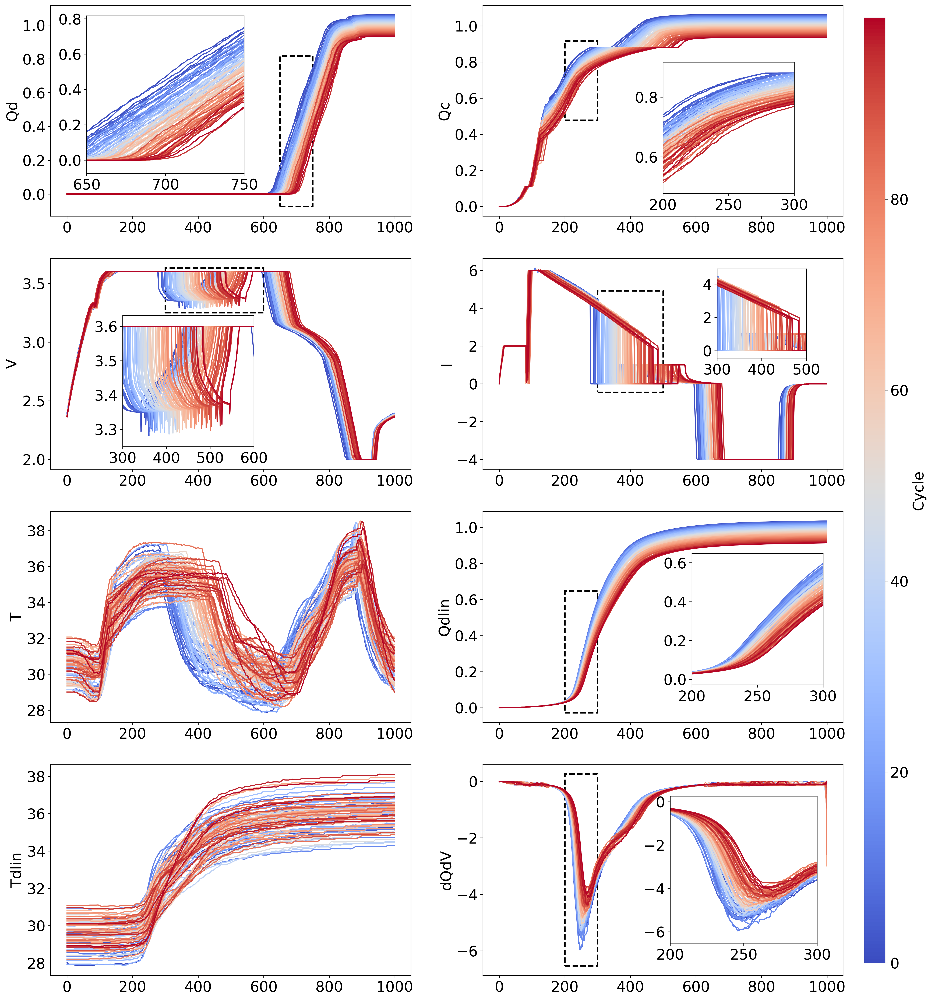

In [149]:
# Suppose you have 8 features
x_zoom_ranges = [
    (650, 750),  # for feature 0
    (200, 300),  # for feature 1
    (300, 600),  # for feature 1
    (300, 500),  # for feature 1
    None,
    (200, 300),  # for feature 1
    None,
    (200, 300),  # for feature 1
]

insets_positions = [
    (0.1, 0.95, 3, 3),
    (0.5, 0.73, 2.5, 2.5),
    (0.2, 0.73, 2.5, 2.5),
    (0.65, 0.95, 1.7, 1.7),
    (0.45, 0.95, 1.5, 1.5),
    (0.58, 0.80, 2.5, 2.5),
    (0.6, 0.65, 2, 2),
    (0.52, 0.85, 2.8, 2.8),
]




cl.plot_inp_cycles_fixed_inset(
    cycle_data, 
    cell_idx=42,
    x_zoom_ranges=x_zoom_ranges,    
    insets_positions=insets_positions,
    
    
)


In [ ]:
for idx in anomalies:
  print(f'abnormal cell idx: {idx}, key: {df.iloc[idx]["Key"]}')
  cl.plot_inp_cycles(cycle_data, cell_idx=idx)

## Remove abnormal cells

In [17]:
eol.shape

(124, 1)

In [18]:
df_eol = pd.DataFrame({
  'Index': range(len(eol.flatten())),
  'eol': eol.flatten()
})

In [19]:
df_eol.sort_values(by='eol', ascending=True)

,Index,eol
42,42,148.0
41,41,300.0
44,44,335.0
82,82,429.0
77,77,429.0
...,...,...
90,90,1836.0
0,0,1852.0
118,118,1935.0
1,1,2160.0


In [20]:
battery_ids_filtered_cae_v1_t1 = np.delete(battery_ids, anomalies)
df_ids_filtered_cae_v1_t1 = pd.DataFrame({
  'Index': range(len(battery_ids_filtered_cae_v1_t1)),
  'Key': battery_ids_filtered_cae_v1_t1
})

In [21]:
df_ids_filtered_cae_v1_t1

,Index,Key
0,0,b1c0
1,1,b1c1
2,2,b1c2
3,3,b1c3
4,4,b1c4
...,...,...
94,94,b3c39
95,95,b3c40
96,96,b3c41
97,97,b3c44


In [22]:
filtered_cycle_sum = np.delete(new_cycle_sum, anomalies, axis=0)
filtered_eol =  np.delete(eol, anomalies, axis=0)
print(filtered_cycle_sum.shape, filtered_eol.shape)

(99, 14, 100) (99, 1)


In [23]:
df_ids_filtered_cae_v1_t1.to_csv(gen_path / 'df_ids_filtered_cae_v1_t1.csv', index=False)
np.save(gen_path / 'cycle_sum_filtered_cae_v1_t1.npy', filtered_cycle_sum)
np.save(gen_path / 'eol_filtered_cae_v1_t1.npy', filtered_eol)